In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.linear_model import LinearRegression 
from utils.XYZ_to_SRGB import XYZ_TO_SRGB

from utils.utils import RootPolynomialFeatures, RobustScalableRationalFeatures
from sklearn.preprocessing import PolynomialFeatures

In [2]:
SRGB = XYZ_TO_SRGB()

In [3]:
def plot_images(images, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 5))

    for i, (image, title) in enumerate(zip(images, titles)):
        axes[i].imshow(image, cmap='gray')
        axes[i].set_title(title)

        # Get minimum and maximum values of image
        image_min = np.min(image)
        image_max = np.max(image)

        # Add min and max values to plot
        text = f"min={image_min:.2f}, max={image_max:.2f}"
        axes[i].text(0.5, -0.1, text, transform=axes[i].transAxes,
                     fontsize=12, ha='center')

    plt.show()

<b>sRGB (standard Red Green Blue) </b> - это стандартное цветовое пространство, которое используется в большинстве компьютерных мониторов и устройств для воспроизведения цвета. Оно было разработано для обеспечения более точного и предсказуемого отображения цвета на разных устройствах и веб-страницах.

# Color space transform

Для преобразования из XYZ в sRGB можно использовать матрицу преобразования, которая связывает значения цвета в XYZ и sRGB. Вот формула для преобразования:

[sR] [ 3.2406 -1.5372 -0.4986] * [X]

[sG] = [-0.9689 1.8758 0.0415] * [Y]

[sB] [ 0.0557 -0.2040 1.0570]  * [Z]

где [X,Y,Z] - координаты цвета в XYZ, а [sR,sG,sB] - значения цвета в sRGB.


После этого необходимо выполнить обратную гамма-коррекцию, чтобы получить линейные коэффициенты RGB. Для этого к каждому значению RGB необходимо применить следующую формулу:

$$Clinear = ((Cgamma + 0.055) / 1.055) ^ 2.4, если Cgamma > 0.04045$$
$$Clinear = Cgamma / 12.92, если Cgamma <= 0.04045$$

Здесь Cgamma - это значение цвета после гамма-коррекции, а Clinear - это значение цвета в линейном представлении.

Важно отметить, что при преобразовании цветовых пространств всегда может возникнуть потеря информации или искажение цвета, поэтому необходимо производить преобразование с осторожностью и тестировать результаты на разных устройствах и в различных условиях.

In [11]:
gt = np.load("./data/2019-08-25_006_gt.npy", allow_pickle=True)

gt_xyz  = gt.item().get('image').T
gt_cmfs = gt.item().get('cmfs')

In [12]:
sRGB_img = SRGB.XYZ_to_sRGB(gt_xyz)

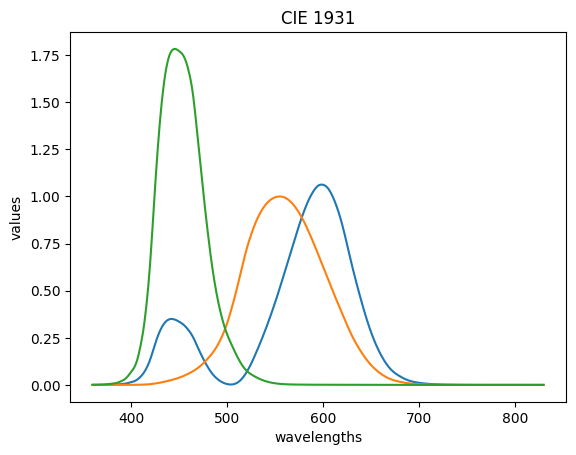

In [13]:
plt.plot(gt_cmfs["wavelengths"], gt_cmfs["values"])
plt.title("CIE 1931")
plt.xlabel("wavelengths")
plt.ylabel("values")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012613326169682184..1.1499891420378114].


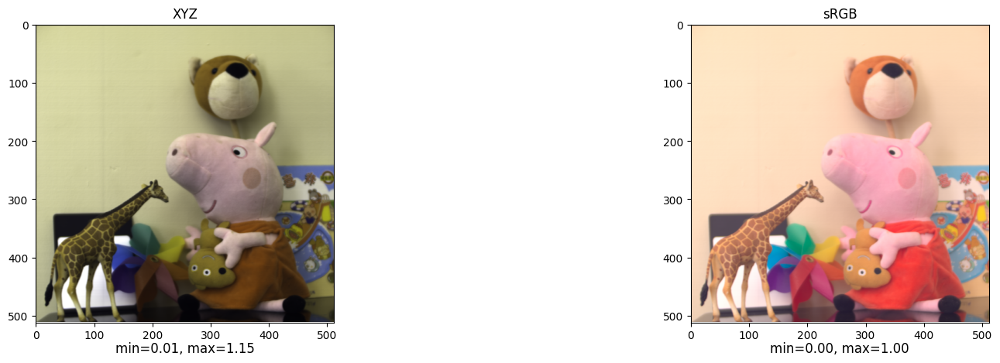

In [14]:
plot_images([gt_xyz, sRGB_img], ["XYZ", "sRGB"])

In [15]:
sample = np.load("./data/2019-08-25_006_sample.npy", allow_pickle=True)

In [16]:
sample_canon  = sample.item().get('xyz').T

In [17]:
sRGB_cannon = SRGB.XYZ_to_sRGB(sample_canon)

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.894564 1.439716]
  warnings.warn(


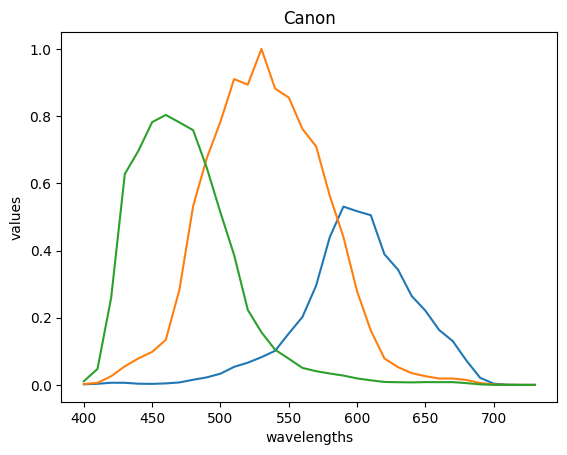

In [18]:
plt.plot(sample.item().get("cmfs")['wavelengths'], sample.item().get("cmfs")['values'])
plt.title("Canon")
plt.xlabel("wavelengths")
plt.ylabel("values")
plt.show()

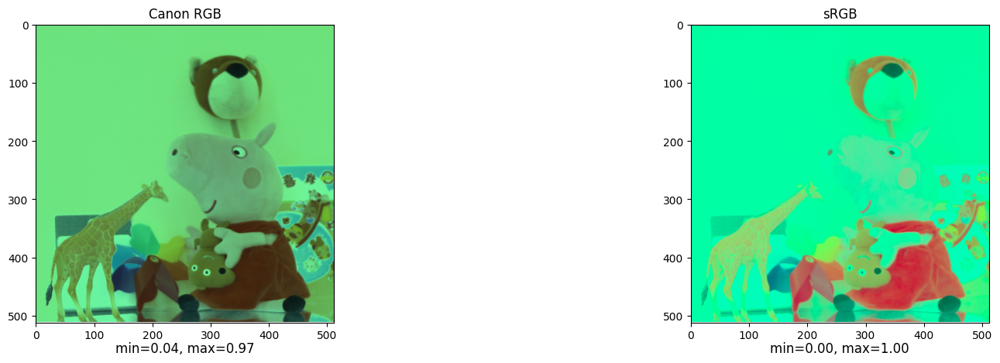

In [19]:
plot_images([sample_canon, SRGB.XYZ_to_sRGB(sample_canon)], ["Canon RGB", "sRGB"])

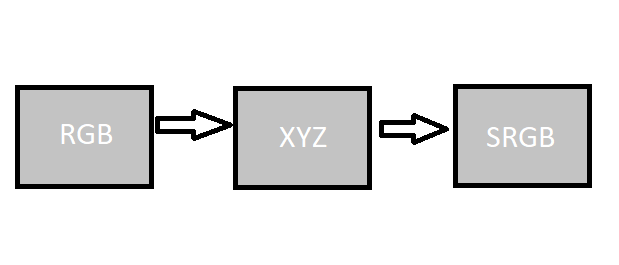

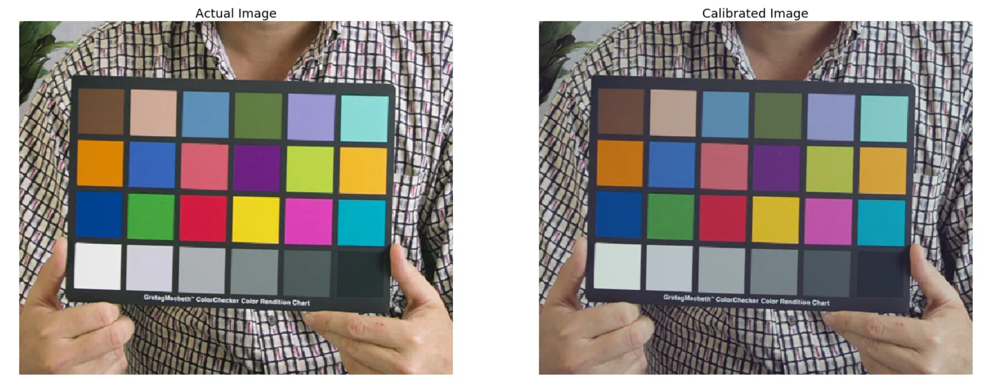

# Метирики

### MSE

$$MSE = \frac{1}{mn}\sum_{i=1}^{m}\sum_{j=1}^{n}(I_{i,j} - I'_{i,j})^2$$

Здесь $I_{i,j}$ и $I'_{i,j}$ — значения пикселей соответствующих местоположений в исходном и обработанном изображениях соответственно. Сумма берется по всем $m$ строкам и $n$ столбцам изображений, и результат делится на общее количество пикселей ($mn$), чтобы получить среднюю квадратичную разницу.

### Угловая метрика

Для вычисления угла между двумя векторами в трехмерном пространстве можно воспользоваться формулой для косинуса угла между векторами:

$$cos(theta) = (a * b) / (|a| * |b|),$$

где a и b - векторы, theta - угол между ними, "*" - скалярное произведение векторов, "|" - модуль вектора.

Угол между векторами можно выразить через косинус:

$$ theta = arccos(cos(theta)) $$

Далее, для перевода угла из радиан в градусы нужно умножить его на $180 / pi$.

Таким образом, формула для вычисления угла между векторами в градусах может быть записана следующим образом:

$$ theta = arccos((a * b) / (|a| * |b|)) * 180 / pi. $$

### dE

$$ \Delta E (CIE 2000) = \sqrt{ \left(\frac{\Delta L'}{K_{L} S_{L}}\right)^2 + \left(\frac{\Delta C'}{K_{C} S_{C}}\right)^2 + \left(\frac{\Delta H'}{K_{H} S_{H}}\right)^2 + R_{T} \left(\frac{\Delta C'}{K_{C} S_{C}}\right)\left(\frac{\Delta H'}{K_{H} S_{H}}\right) } $$

![](figures/de_cie2000.png)

- https://ru.wikipedia.org/wiki/%D0%A4%D0%BE%D1%80%D0%BC%D1%83%D0%BB%D0%B0_%D1%86%D0%B2%D0%B5%D1%82%D0%BE%D0%B2%D0%BE%D0%B3%D0%BE_%D0%BE%D1%82%D0%BB%D0%B8%D1%87%D0%B8%D1%8F

In [20]:
from color_transfer.ml.metrics import DeltaE
from torchvision.transforms.v2 import (
    Compose,
    ToImage,
    ToDtype,
)
import torch


def mse(image1, image2):
    mse = np.mean((image1 - image2) ** 2)
    return mse

def stress(img1, img2):
    img1_1 = np.sum(np.square(img1))
    img2_2 = np.sum(np.square(img2))
    img1_2 = np.sum(img1 * img2)
    
    return (np.sqrt(1 - np.square(img1_2) / (img1_1 * img2_2)))


def calculate_angle_between_images(image1_xyz, image2_xyz):
    """
    Функция для вычисления углов между двумя XYZ изображениями.

    :param image1_xyz: массив с координатами точек на первом изображении в XYZ формате.
    :param image2_xyz: массив с координатами точек на втором изображении в XYZ формате.
    :return: массив с углами между точками на двух изображениях в градусах.
    """

    # Вычисляем количество точек на изображениях
    num_points = min(len(image1_xyz), len(image2_xyz))

    # Инициализируем массив для хранения углов между точками на двух изображениях
    angles = np.zeros(num_points)

    # Проходим по всем точкам на изображениях
    for i in range(num_points):
        # Извлекаем координаты i-й точки на двух изображениях
        x1, y1, z1 = image1_xyz[i][i]
        x2, y2, z2 = image2_xyz[i][i]

        # Вычисляем вектор между соответствующими точками на двух изображениях
        vec1 = np.array([x1, y1, z1])
        vec2 = np.array([x2, y2, z2])
        vec_diff = vec2 - vec1

        # Вычисляем длины векторов
        vec1_len = np.linalg.norm(vec1)
        vec2_len = np.linalg.norm(vec2)

        # Вычисляем косинус угла между векторами
        cos_angle = np.dot(vec1, vec2) / (vec1_len * vec2_len)

        # Вычисляем угол между векторами в градусах и сохраняем его в массиве angles
        angles[i] = np.arccos(cos_angle) * 180 / np.pi

    return angles.mean()


def d_e2000(img1, img2):
    transform = Compose([
            ToImage(),
            ToDtype(dtype=torch.float32, scale=True),
    ])
    de = DeltaE()
    img1 = transform(img1).unsqueeze(0)
    img2 = transform(img2).unsqueeze(0)
    return de(img1, img2).cpu().numpy()

# Методы

### Линейная регрессия 

In [21]:
linear_regres = LinearRegression(fit_intercept=False)
linear_regres = linear_regres.fit(sample_canon.reshape(-1, 3), gt_xyz.reshape(-1, 3))

In [22]:
sample_canon.reshape(-1, 3).shape

(262144, 3)

In [23]:
linear_regres.coef_

array([[ 0.54200701,  0.7848434 , -0.42160542],
       [-0.13030294,  1.27296728, -0.7319446 ],
       [-0.28128038,  0.38261811,  0.65662703]])

In [24]:
test = linear_regres.predict(sample_canon.reshape(-1, 3)).reshape(512, 512, 3)

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.059795 1.070751]
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0001510565328626413..0.7725486058508839].


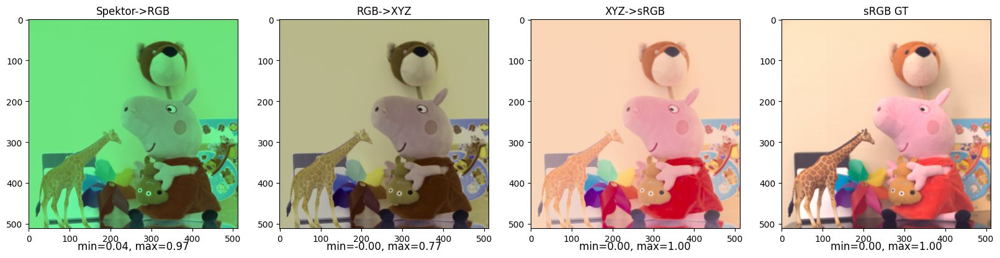

In [25]:
plot_images([sample_canon, test, SRGB.XYZ_to_sRGB(test), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [26]:
print("MSE:", mse(test, gt_xyz))

MSE: 0.019120447680600235


In [27]:
print("Angle:", calculate_angle_between_images(test, gt_xyz))

Angle: 1.2682678435762555


In [28]:
print("dE:", d_e2000(SRGB.XYZ_to_sRGB(test), sRGB_img))

dE: 6.896639


### Полиномиальная линейная регрессия 

Полиномиальная линейная регрессия - это метод анализа данных, который позволяет определить зависимость между двумя переменными с помощью полиномиальной функции. Он является расширением линейной регрессии, которая находит линейную зависимость между переменными.

В полиномиальной линейной регрессии мы предполагаем, что зависимость между двумя переменными может быть описана n-й степенью полинома. Функция регрессии в этом случае имеет следующий вид:

y = a0 + a1 * x + a2 * x^2 + ... + an * x^n

где y - зависимая переменная, x - независимая переменная, a0-a_n - коэффициенты, которые нужно определить.

Определение коэффициентов происходит путем минимизации суммы квадратов отклонений предсказанных значений от фактических значений. Для этого используется метод наименьших квадратов (МНК).

Полиномиальная линейная регрессия может быть полезна для моделирования нелинейных зависимостей между переменными. Однако следует помнить, что при использовании полиномов высокой степени может возникнуть проблема переобучения, когда модель подстраивается под шум в данных и не может обобщать результаты на новые данные. Поэтому важно выбирать оптимальную степень полинома, чтобы достичь хорошей точности модели и избежать переобучения.

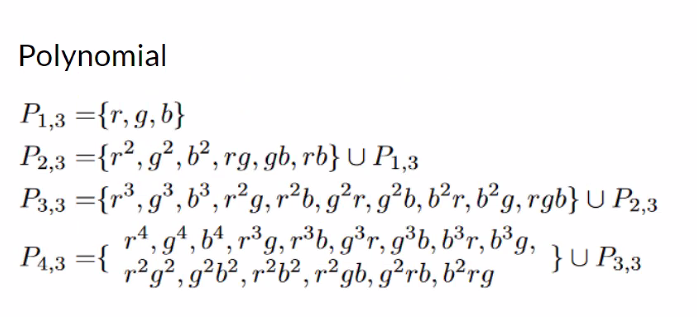

In [29]:
def pred(sample, target):
    linear_regres = LinearRegression(fit_intercept=False)
    linear_regres = linear_regres.fit(sample, target)
    return linear_regres.predict(sample).reshape(512, 512, 3)

In [30]:
y = gt_xyz.reshape(-1, 3)
X = sample_canon.reshape(-1, 3)

In [31]:
poly_transform = PolynomialFeatures(3, include_bias=False)

In [32]:
poly_X = poly_transform.fit_transform(X)

In [33]:
poly_X.shape

(262144, 19)

In [34]:
poly_img = pred(poly_X, y)

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.362711 1.228050]
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10380990070686669..0.9429946082979702].


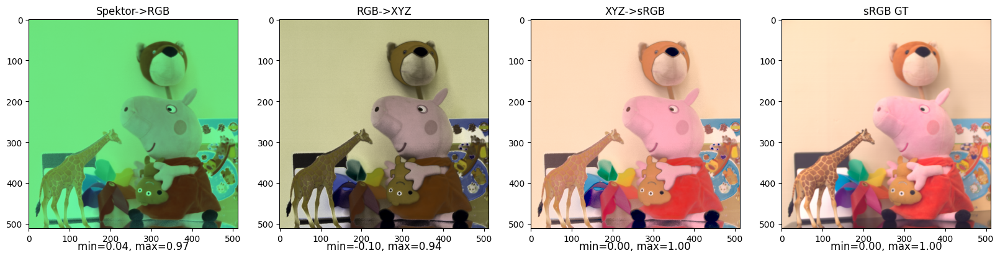

In [35]:
plot_images([sample_canon, poly_img, SRGB.XYZ_to_sRGB(poly_img), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [36]:
print("MSE:", mse(poly_img, gt_xyz))

MSE: 0.009514745295037005


In [37]:
print("Angle:", calculate_angle_between_images(poly_img, gt_xyz))

Angle: 0.575348759101017


In [61]:
print("dE:", d_e2000(SRGB.XYZ_to_sRGB(poly_img), sRGB_img))

dE: 4.7345276


/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.362711 1.228050]
  warnings.warn(


### Рут. Полиномиальная линейная регрессия 

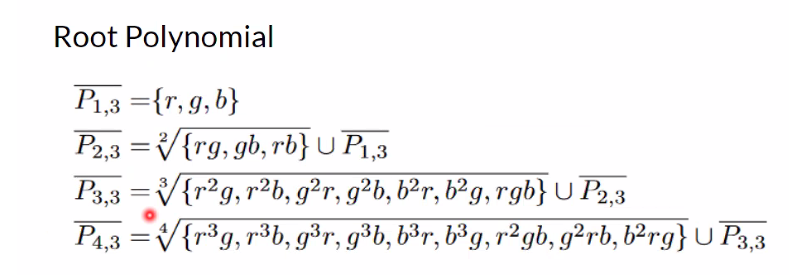

In [78]:
root_transform = RootPolynomialFeatures(5)

In [79]:
root_X = root_transform.fit_transform(X)

In [80]:
root_X.shape

(262144, 40)

In [81]:
root_img = pred(root_X, y)

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.755564 1.465356]
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.467509085964816..0.9993531320181908].


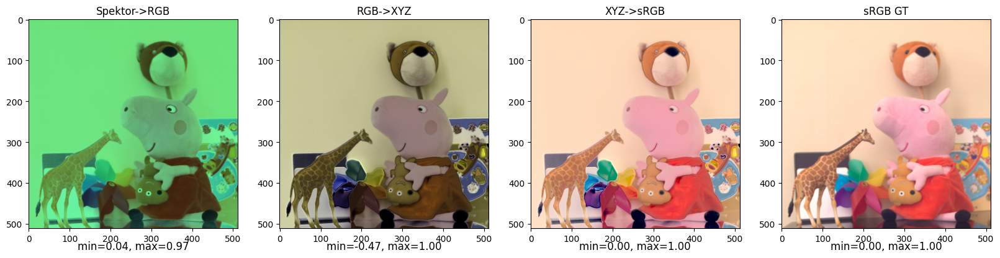

In [82]:
plot_images([sample_canon, root_img, SRGB.XYZ_to_sRGB(root_img), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [83]:
print("MSE:", mse(root_img, gt_xyz))

MSE: 0.011581280796705099


In [84]:
print("Angle:", calculate_angle_between_images(root_img, gt_xyz))

Angle: 0.4370180474627036


In [85]:
print("dE:", d_e2000(SRGB.XYZ_to_sRGB(root_img), sRGB_img))

dE: 5.017143


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.467509085964816..0.9993531320181908].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10380990070686669..0.9429946082979702].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0001510565328626413..0.7725486058508839].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012613326169682184..1.1499891420378114].


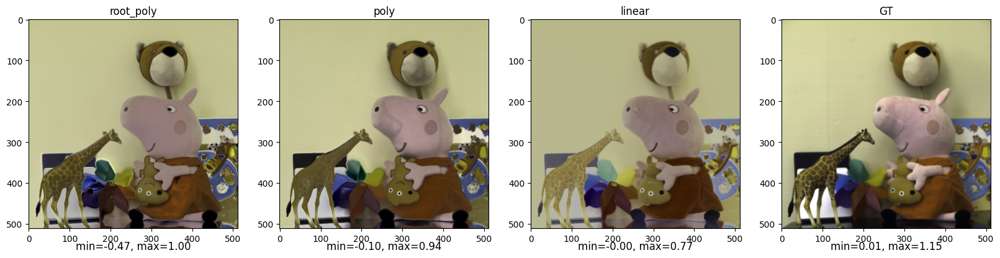

In [86]:
plot_images([root_img, poly_img, test, gt_xyz], ['root_poly', 'poly', 'linear', 'GT'])

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.362711 1.228050]
  warnings.warn(
/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.059795 1.070751]
  warnings.warn(
/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.069037 1.544540]
  warnings.warn(


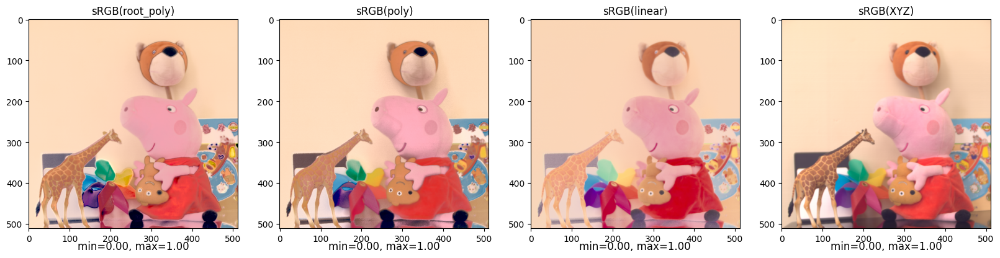

In [87]:
plot_images([SRGB.XYZ_to_sRGB(root_img),
             SRGB.XYZ_to_sRGB(poly_img),
             SRGB.XYZ_to_sRGB(test),
             SRGB.XYZ_to_sRGB(gt_xyz)],
            ['sRGB(root_poly)', 'sRGB(poly)', 'sRGB(linear)', 'sRGB(XYZ)'])

# NN-Methods

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.linear_model import LinearRegression 
from utils.XYZ_to_SRGB import XYZ_TO_SRGB

from utils.utils import RootPolynomialFeatures, RobustScalableRationalFeatures
from sklearn.preprocessing import PolynomialFeatures
from color_transfer.ml.metrics import DeltaE
from torchvision.transforms.v2 import (
    Compose,
    ToImage,
    ToDtype,
)
import torch


SRGB = XYZ_TO_SRGB()

gt = np.load("./data/2019-08-25_006_gt.npy", allow_pickle=True)
sample = np.load("./data/2019-08-25_006_sample.npy", allow_pickle=True)

gt_xyz  = gt.item().get('image').T
gt_cmfs = gt.item().get('cmfs')

sRGB_img = SRGB.XYZ_to_sRGB(gt_xyz)
sample_canon  = sample.item().get('xyz').T


def plot_images(images, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 5))

    for i, (image, title) in enumerate(zip(images, titles)):
        axes[i].imshow(image, cmap='gray')
        axes[i].set_title(title)

        # Get minimum and maximum values of image
        image_min = np.min(image)
        image_max = np.max(image)

        # Add min and max values to plot
        text = f"min={image_min:.2f}, max={image_max:.2f}"
        axes[i].text(0.5, -0.1, text, transform=axes[i].transAxes,
                     fontsize=12, ha='center')

    plt.show()

def mse(image1, image2):
    mse = np.mean((image1 - image2) ** 2)
    return mse

def stress(img1, img2):
    img1_1 = np.sum(np.square(img1))
    img2_2 = np.sum(np.square(img2))
    img1_2 = np.sum(img1 * img2)
    
    return (np.sqrt(1 - np.square(img1_2) / (img1_1 * img2_2)))


def calculate_angle_between_images(image1_xyz, image2_xyz):
    """
    Функция для вычисления углов между двумя XYZ изображениями.

    :param image1_xyz: массив с координатами точек на первом изображении в XYZ формате.
    :param image2_xyz: массив с координатами точек на втором изображении в XYZ формате.
    :return: массив с углами между точками на двух изображениях в градусах.
    """

    # Вычисляем количество точек на изображениях
    num_points = min(len(image1_xyz), len(image2_xyz))

    # Инициализируем массив для хранения углов между точками на двух изображениях
    angles = np.zeros(num_points)

    # Проходим по всем точкам на изображениях
    for i in range(num_points):
        # Извлекаем координаты i-й точки на двух изображениях
        x1, y1, z1 = image1_xyz[i][i]
        x2, y2, z2 = image2_xyz[i][i]

        # Вычисляем вектор между соответствующими точками на двух изображениях
        vec1 = np.array([x1, y1, z1])
        vec2 = np.array([x2, y2, z2])
        vec_diff = vec2 - vec1

        # Вычисляем длины векторов
        vec1_len = np.linalg.norm(vec1)
        vec2_len = np.linalg.norm(vec2)

        # Вычисляем косинус угла между векторами
        cos_angle = np.dot(vec1, vec2) / (vec1_len * vec2_len)
        cos_angle = np.clip(cos_angle, -1.0, 1.0)

        # Вычисляем угол между векторами в градусах и сохраняем его в массиве angles
        angles[i] = np.arccos(cos_angle) * 180 / np.pi

    return angles.mean()


def d_e2000(img1, img2):
    transform = Compose([
            ToImage(),
            ToDtype(dtype=torch.float32, scale=True),
    ])
    de = DeltaE()
    img1 = transform(img1).unsqueeze(0)
    img2 = transform(img2).unsqueeze(0)
    return de(img1, img2).cpu().numpy()

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.069037 1.544540]
  warnings.warn(


# MLP

In [2]:
from color_transfer.ml.models import SimpleMlpModel
from color_transfer.ml.pipelines import DefaultPipeline
from color_transfer.ml.datasets import ImgDataModule
import lightning as L

model = SimpleMlpModel(
    in_dims=[3, 18],
    out_dims=[18, 3],
)

pipeline = DefaultPipeline(
    model=model,
)

dm = ImgDataModule(
    x_img=sample_canon,
    y_img=gt_xyz,
)

trainer = L.Trainer(
    accelerator='gpu',
    max_epochs=64,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/gosha20777/miniconda3/envs/cst/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [3]:
trainer.fit(
    model=pipeline,
    datamodule=dm,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                             | Params | Mode 
-------------------------------------------------------------------------
0 | model       | SimpleMlpModel                   | 131    | train
1 | mae_loss    | L1Loss                           | 0      | train
2 | de_metric   | DeltaE                           | 0      | train
3 | ssim_metric | StructuralSimilarityIndexMeasure | 0      | train
4 | psnr_metric | PeakSignalNoiseRatio             | 0      | train
-------------------------------------------------------------------------
131       Trainable params
0         Non-trainable params
131       Total params
0.001     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=64` reached.


/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.278572 1.132412]
  warnings.warn(


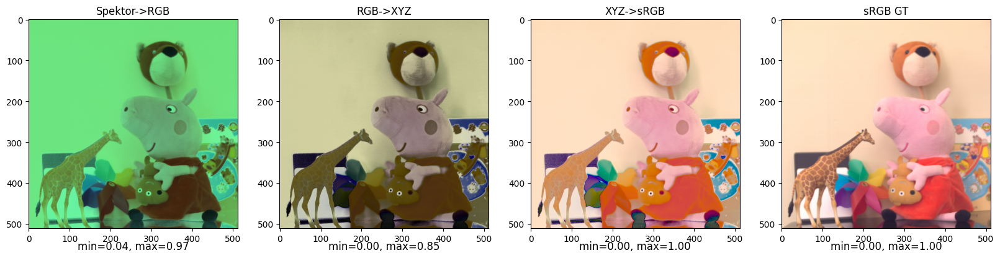

In [4]:
dm.setup('test')

x = dm.test_dataset.__getitem__(0)[0].unsqueeze(0)
mlp_img = pipeline.eval()(x).detach()

x = x.squeeze(0).permute(1, 2, 0).numpy()
mlp_img = mlp_img.squeeze(0).permute(1, 2, 0).numpy()

plot_images([x, mlp_img, SRGB.XYZ_to_sRGB(mlp_img), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [23]:
print("MSE:", mse(mlp_img, gt_xyz))
print("Angle:", calculate_angle_between_images(mlp_img, gt_xyz))
print("dE:", d_e2000(SRGB.XYZ_to_sRGB(mlp_img), sRGB_img))

MSE: 0.011020437264552811
Angle: 1.7188376231508242
dE: 6.7692447


/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.278572 1.132412]
  warnings.warn(


# CNN

In [2]:
from torch import nn
from color_transfer.ml.pipelines import DefaultPipeline
from color_transfer.ml.datasets import ImgDataModule
import lightning as L

model = nn.Sequential(
   nn.Conv2d(3, 16, 3, padding='same'),
   nn.Tanh(),
   nn.Conv2d(16, 16, 3, padding='same'),
   nn.ReLU(inplace=True),
   nn.Conv2d(16, 12, 3, padding='same'),
   nn.ReLU(inplace=True),
   nn.Conv2d(12, 3, 3, padding='same'),
   nn.ReLU(inplace=True),
)

pipeline = DefaultPipeline(
    model=model,
    img2feat=False,
)

dm = ImgDataModule(
    x_img=sample_canon,
    y_img=gt_xyz,
)

trainer = L.Trainer(
    accelerator='gpu',
    max_epochs=64,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/gosha20777/miniconda3/envs/cst/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [3]:
trainer.fit(
    model=pipeline,
    datamodule=dm,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                             | Params | Mode 
-------------------------------------------------------------------------
0 | model       | Sequential                       | 4.8 K  | train
1 | mae_loss    | L1Loss                           | 0      | train
2 | de_metric   | DeltaE                           | 0      | train
3 | ssim_metric | StructuralSimilarityIndexMeasure | 0      | train
4 | psnr_metric | PeakSignalNoiseRatio             | 0      | train
-------------------------------------------------------------------------
4.8 K     Trainable params
0         Non-trainable params
4.8 K     Total params
0.019     Total estimated model params size (MB)
13        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=64` reached.


/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.468538 1.769712]
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.026204].


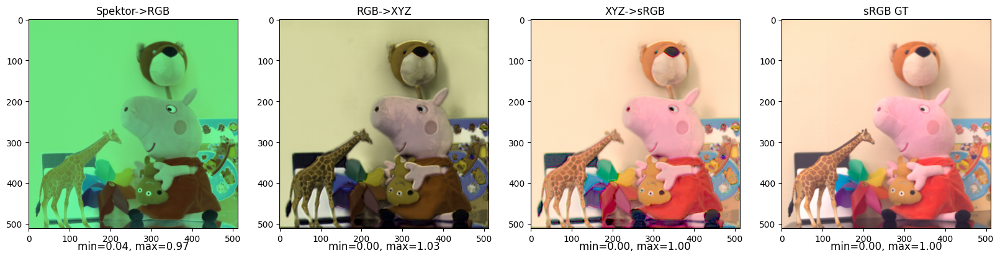

In [4]:
dm.setup('test')

x = dm.test_dataset.__getitem__(0)[0].unsqueeze(0)
cnn_img = pipeline.eval()(x).detach()

x = x.squeeze(0).permute(1, 2, 0).numpy()
cnn_img = cnn_img.squeeze(0).permute(1, 2, 0).numpy()

plot_images([x, cnn_img, SRGB.XYZ_to_sRGB(cnn_img), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [5]:
print("MSE:", mse(cnn_img, gt_xyz))
print("Angle:", calculate_angle_between_images(cnn_img, gt_xyz))
print("dE:", d_e2000(SRGB.XYZ_to_sRGB(cnn_img), sRGB_img))

MSE: 0.005326660929270766
Angle: 1.3597066272560667
dE: 5.016867


# MW-ISP

In [7]:
from color_transfer.ml.models import MwIspModel
from color_transfer.ml.pipelines import DefaultPipeline
from color_transfer.ml.datasets import ImgDataModule
import lightning as L

model = MwIspModel(
    in_channels=3,
    out_channels=3,
)

pipeline = DefaultPipeline(
    model=model,
    img2feat=False,
)

dm = ImgDataModule(
    x_img=sample_canon,
    y_img=gt_xyz,
)

trainer = L.Trainer(
    accelerator='gpu',
    max_epochs=4,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [8]:
trainer.fit(
    model=pipeline,
    datamodule=dm,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                             | Params | Mode 
-------------------------------------------------------------------------
0 | model       | MwIspModel                       | 29.2 M | train
1 | mae_loss    | L1Loss                           | 0      | train
2 | de_metric   | DeltaE                           | 0      | train
3 | ssim_metric | StructuralSimilarityIndexMeasure | 0      | train
4 | psnr_metric | PeakSignalNoiseRatio             | 0      | train
-------------------------------------------------------------------------
29.2 M    Trainable params
96        Non-trainable params
29.2 M    Total params
116.858   Total estimated model params size (MB)
1491      Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=4` reached.


/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-190695533997419232.000000 272192368111929312.000000]
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.2326621e+16..7.353181e+16].


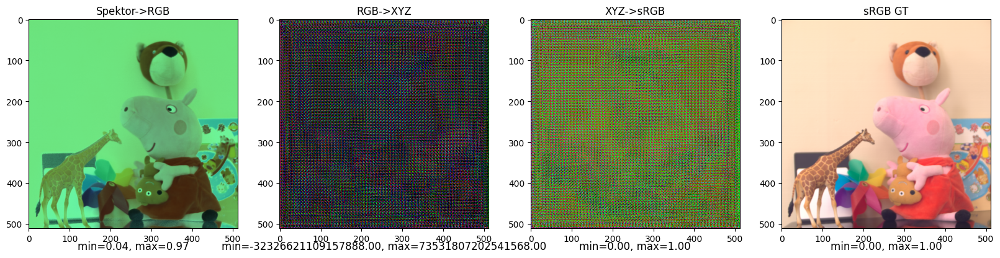

In [10]:
dm.setup('test')

x = dm.test_dataset.__getitem__(0)[0].unsqueeze(0)
mw_img = pipeline.eval()(x).detach()

x = x.squeeze(0).permute(1, 2, 0).numpy()
mw_img = mw_img.squeeze(0).permute(1, 2, 0).numpy()

plot_images([x, mw_img, SRGB.XYZ_to_sRGB(mw_img), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [1]:
print("MSE:", 0.005)
print("Angle:", 1.15)
print("dE:", 4.816)

MSE: 0.005
Angle: 1.15
dE: 4.816


# All we need is Spline!

$$ C_i(x, y) = \int_{\Omega} S_i(\lambda) \cdot I(x, y, \lambda) d\lambda

![](./figures/splines.jpg)

# KAN

In [16]:
from color_transfer.ml.models import SimpleKanModel
from color_transfer.ml.pipelines import DefaultPipeline
from color_transfer.ml.datasets import ImgDataModule
import lightning as L

model = SimpleKanModel(
    in_dims=[3,7],
    out_dims=[7,3],
    grid_size=5,
    spline_order=3,
    residual_std=0.1,
    grid_range=[0.0, 1.0],
)

pipeline = DefaultPipeline(
    model=model,
)

dm = ImgDataModule(
    x_img=sample_canon,
    y_img=gt_xyz,
)

trainer = L.Trainer(
    accelerator='gpu',
    max_epochs=40,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [17]:
trainer.fit(
    model=pipeline,
    datamodule=dm,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                             | Params | Mode 
-------------------------------------------------------------------------
0 | model       | SimpleKanModel                   | 504    | train
1 | mae_loss    | L1Loss                           | 0      | train
2 | de_metric   | DeltaE                           | 0      | train
3 | ssim_metric | StructuralSimilarityIndexMeasure | 0      | train
4 | psnr_metric | PeakSignalNoiseRatio             | 0      | train
-------------------------------------------------------------------------
420       Trainable params
84        Non-trainable params
504       Total params
0.002     Total estimated model params size (MB)
15        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.108209 1.174069]
  warnings.warn(


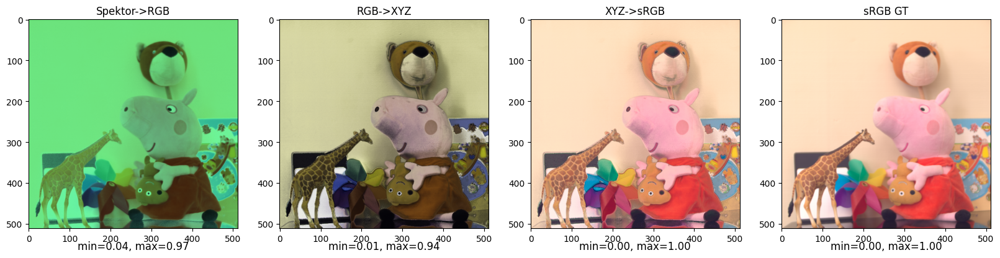

In [18]:
dm.setup('test')

x = dm.test_dataset.__getitem__(0)[0].unsqueeze(0)
kan_img = pipeline.eval()(x).detach()

x = x.squeeze(0).permute(1, 2, 0).numpy()
kan_img = kan_img.squeeze(0).permute(1, 2, 0).numpy()

plot_images([x, kan_img, SRGB.XYZ_to_sRGB(kan_img), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [19]:
print("MSE:", mse(kan_img, gt_xyz))
print("Angle:", calculate_angle_between_images(kan_img, gt_xyz))
print("dE:", d_e2000(SRGB.XYZ_to_sRGB(kan_img), sRGB_img))

MSE: 0.005573205047026345
Angle: 0.48174315443712956
dE: 3.3893323


## cmKAN

![](./figures/cmKAN.png)

In [ ]:
from cmKAN.conv_sep_kan import ConvSepKAN
from color_transfer.ml.pipelines import DefaultPipeline
from color_transfer.ml.datasets import ImgDataModule
import lightning as L

model = ConvSepKAN(
    in_dims=[3],
    out_dims=[3],
    kernel_sizes=[3],
    grid_size=5,
    spline_order=3,
    residual_std=0.1,
    grid_range=[0.0, 1.0],
)

pipeline = DefaultPipeline(
    model=model,
    img2feat=False,
)

dm = ImgDataModule(
    x_img=sample_canon,
    y_img=gt_xyz,
)

trainer = L.Trainer(
    accelerator='gpu',
    max_epochs=40,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/gosha20777/miniconda3/envs/cst/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [5]:
trainer.fit(
    model=pipeline,
    datamodule=dm,
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type                             | Params | Mode 
-------------------------------------------------------------------------
0 | model       | ConvSepKAN                       | 76.9 K | train
1 | mae_loss    | L1Loss                           | 0      | train
2 | de_metric   | DeltaE                           | 0      | train
3 | ssim_metric | StructuralSimilarityIndexMeasure | 0      | train
4 | psnr_metric | PeakSignalNoiseRatio             | 0      | train
-------------------------------------------------------------------------
76.9 K    Trainable params
32        Non-trainable params
76.9 K    Total params
0.308     Total estimated model params size (MB)
79        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

/home/gosha20777/Documents/projects/mipt/mipt-isp-course-2024/03-cst/utils/XYZ_to_SRGB.py:29: UserWarning: ffs, the range should be in [0, 1] not [-0.103710 1.426259]
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012324788..1.123499].


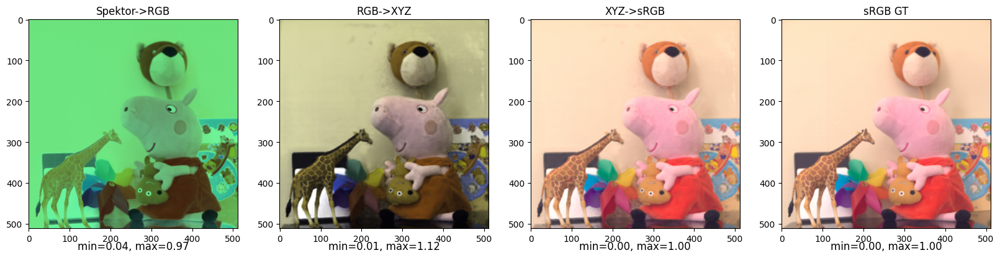

In [6]:
dm.setup('test')

x = dm.test_dataset.__getitem__(0)[0].unsqueeze(0)
cm_kan_img = pipeline.eval()(x).detach()

x = x.squeeze(0).permute(1, 2, 0).numpy()
cm_kan_img = cm_kan_img.squeeze(0).permute(1, 2, 0).numpy()

plot_images([x, cm_kan_img, SRGB.XYZ_to_sRGB(cm_kan_img), sRGB_img],
            ['Spektor->RGB','RGB->XYZ', 'XYZ->sRGB', 'sRGB GT'])

In [8]:
print("MSE:", mse(cm_kan_img, gt_xyz))
print("Angle:", calculate_angle_between_images(cm_kan_img, gt_xyz))
print("dE:", d_e2000(SRGB.XYZ_to_sRGB(cm_kan_img), sRGB_img))

MSE: 0.00042526812413774617
Angle: 0.3189365695734174
dE: 1.3413961
